### Machine Learning Demo: Predicting restaurant ratings using text from Yelp reviews
This notebook demonstrates an example natural language processing & machine learning project using Python and the "PyData" ecosystem. The problem we're trying to solve is estimating a restaurant's overall "star" rating on Yelp using only the text that customers have written about the restaurant in Yelp reviews as an input.

<a href="http://www.yelp.com" target="_blank">Yelp</a> is a business listings and review service available in a number of countries around the world. Yelp is an attractive subject for a machine learning demo because the company publishes a meaningful chunk of their overall dataset for use in educational purposes. The dataset is available for download in the JSON format on the <a href="http://www.yelp.com/dataset_challenge" target="_blank">Yelp Dataset Challenge</a> page.

**For this notebook to work as written,** you'll need to download the Yelp Dataset at the link above and place the *yelp_dataset_challenge_academic_dataset* directory in the notebook's project folder.

As you work through the notebook, you are encouraged to run the code live to see it in action. Feel free to edit, re-run, and  experiment with the code yourself!

#### Now, let's get started...
This first cell imports some libraries that we'll use later. Extensive documentation on each of these libraries and what they do is readily available online.


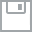
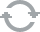
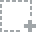
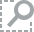
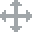
...
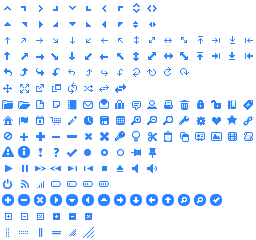
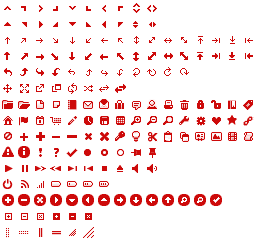
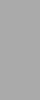
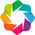
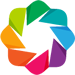

In [1]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.svm import LinearSVR, LinearSVC

from bokeh.plotting import figure, gridplot, output_notebook, show
from bokeh.models import ColumnDataSource

output_notebook()

This cell assigns the location of the Yelp Dataset files to the `DataDirectory` variable.

In [2]:
DataDirectory = os.path.join(os.getcwd(), 'yelp_dataset_challenge_academic_dataset')
DataDirectory

'/Users/patrick/Domino/DataScienceWithPythonMeetup/yelp_dataset_challenge_academic_dataset'

Here, I'm reading in the business data file and creating a Pandas DataFrame named `businesses` out of it.

In [3]:
BusinessesFilePath = os.path.join(DataDirectory, 'yelp_academic_dataset_business.json')

with open(BusinessesFilePath, 'r') as f:
    BusinessData = f.readlines()

BusinessData = map(lambda x: x.rstrip(), BusinessData)
BusinessJsonStr = "[" + ','.join(BusinessData) + "]"

businesses = pd.read_json(BusinessJsonStr)

businesses.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 61184 entries, 0 to 61183
Data columns (total 15 columns):
attributes       61184 non-null object
business_id      61184 non-null object
categories       61184 non-null object
city             61184 non-null object
full_address     61184 non-null object
hours            61184 non-null object
latitude         61184 non-null float64
longitude        61184 non-null float64
name             61184 non-null object
neighborhoods    61184 non-null object
open             61184 non-null bool
review_count     61184 non-null int64
stars            61184 non-null float64
state            61184 non-null object
type             61184 non-null object
dtypes: bool(1), float64(3), int64(1), object(10)
memory usage: 7.1+ MB


61,184 businesses is a lot of data for a simple demo, so let's filter things down. I lived in Pittsburgh for a long time, so let's filter our `businesses` DataFrame down to restaurants in the city of Pittsburgh, and store the result in a new DataFrame named `PittsburghBusinesses`.

In [4]:
PittsburghBusinesses = businesses[(businesses['city'] == 'Pittsburgh')]
PittsburghBusinesses['Restaurant?'] = PittsburghBusinesses['categories'].apply(lambda x: True if 'Restaurants' in x else False)
PittsburghBusinesses = PittsburghBusinesses[PittsburghBusinesses['Restaurant?'] == True]
PittsburghBusinesses = PittsburghBusinesses.set_index('business_id')
PittsburghBusinesses.shape

/Users/patrick/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


(1217, 15)

Now we have 1,217 business listings in our dataset. In the next cell, I create a "frozenset" called `BusinessSet` containing the business_id variables associated with each business. "frozenset" objects are good for facilitating fast lookups.

In [5]:
BusinessSet = frozenset(PittsburghBusinesses.index)
len(BusinessSet)

1217

Next, let's read in the customer reviews. There are ~1.6M reviews in the overall dataset. We only need the reviews associated with our set of restaurants in Pittsburgh. Let's read in the reviews from the dataset file one at a time, and if they're associated with one of the business_ids we have stored in `BusinessSet`, let's add them to a list called `PittsburghReviews` for further processing.

This cell may take a minute or two to run.

In [6]:
ReviewsFilePath = os.path.join(DataDirectory, 'yelp_academic_dataset_review.json')

PittsburghReviews = []

with open(ReviewsFilePath, 'r') as ReviewsFile:
    
    for line in ReviewsFile:
        
        ThisReview = json.loads(line)
    
        if ThisReview['business_id'] in BusinessSet:
            PittsburghReviews.append(ThisReview)

len(PittsburghReviews)

44126

Looks like we have 44,126 customer reviews associated with our 1,217 restaurants.

Let's display the first customer review in the list to see how the data is formatted.

In [7]:
PittsburghReviews[0]

{u'business_id': u'wqu7ILomIOPSduRwoWp4AQ',
 u'date': u'2012-03-11',
 u'review_id': u'dMjHtAGhmildMDhCefJ20w',
 u'stars': 1,
 u'text': u'We went on a weeknight.  Place was not busy waited over 20 minutes for drinks and to have our order taken.  We ordered an app and it came out with the meals and that was another 20 minutes or so.  Food was luke warm at best.  I would not go back.',
 u'type': u'review',
 u'user_id': u'5nIkRQ6Ip_SMCg7zDfBbww',
 u'votes': {u'cool': 0, u'funny': 0, u'useful': 0}}

Let's turn our list of customer reviews into a Pandas DataFrame, named `PittsburghReviewsDf`, which will make working with the data a little easier.

In [8]:
PittsburghReviewsDf = pd.DataFrame(PittsburghReviews)
PittsburghReviewsDf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44126 entries, 0 to 44125
Data columns (total 8 columns):
business_id    44126 non-null object
date           44126 non-null object
review_id      44126 non-null object
stars          44126 non-null int64
text           44126 non-null object
type           44126 non-null object
user_id        44126 non-null object
votes          44126 non-null object
dtypes: int64(1), object(7)
memory usage: 3.0+ MB


Next, we need to connect data from the customer reviews with the restaurants that the reviews are about. Here, we iterate through the rows of the `PittsburghBusinesses` dataframe and we add three new columns related to the customer reviews:
- The count of reviews that this restaurant has received
- The average star rating of all the star ratings from the individual customer reviews
- The text from all the customer reviews. The text from all reviews is joined together in one big block.

This cell may take a minute or two to run.

In [9]:
PittsburghBusinesses['ReviewCount'] = 0
PittsburghBusinesses['CalculatedAverageStars'] = 0
PittsburghBusinesses['TextFromReviews'] = ' '

for business_id, business_data in PittsburghBusinesses.iterrows():
    
    ReviewsThisBusiness = PittsburghReviewsDf[PittsburghReviewsDf['business_id'] == business_id]
    
    CountOfReviews = len(ReviewsThisBusiness)
    
    CalculatedAverageStars = ReviewsThisBusiness['stars'].mean()
    
    TextFromReviews = ' '.join(ReviewsThisBusiness['text'].tolist())
    
    PittsburghBusinesses.loc[business_id, 'ReviewCount':'TextFromReviews'] = [CountOfReviews,
                                                                              CalculatedAverageStars,
                                                                              TextFromReviews]
    
PittsburghBusinesses.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1217 entries, wqu7ILomIOPSduRwoWp4AQ to qCdhI4LCUIuzbLKt6znEFg
Data columns (total 18 columns):
attributes                1217 non-null object
categories                1217 non-null object
city                      1217 non-null object
full_address              1217 non-null object
hours                     1217 non-null object
latitude                  1217 non-null float64
longitude                 1217 non-null float64
name                      1217 non-null object
neighborhoods             1217 non-null object
open                      1217 non-null bool
review_count              1217 non-null int64
stars                     1217 non-null float64
state                     1217 non-null object
type                      1217 non-null object
Restaurant?               1217 non-null bool
ReviewCount               1217 non-null int64
CalculatedAverageStars    1217 non-null float64
TextFromReviews           1217 non-null object
dtypes: bool(2)

Let's take a look at a preview of our `PittsburghBusinesses` DataFrame, including the new columns we've added for each business.

In [10]:
PittsburghBusinesses.sample(3)

,attributes,categories,city,full_address,hours,latitude,longitude,name,neighborhoods,open,review_count,stars,state,type,Restaurant?,ReviewCount,CalculatedAverageStars,TextFromReviews
business_id,,,,,,,,,,,,,,,,,,
b54fyOfHMQjxQ2YTomykvw,"{u'Take-out': False, u'Price Range': 2, u'Outd...","[Breakfast & Brunch, Diners, Restaurants]",Pittsburgh,"1719 E Carson St\nSouth Side\nPittsburgh, PA 1...","{u'Monday': {u'close': u'02:00', u'open': u'11...",40.428878,-79.981307,Folino's Ristorante,[South Side],False,7,3.5,PA,business,True,6,3.500000,Went here thinking we were going to Tom's Dine...
NczaqzFtDId9GmVTy2GWHg,"{u'Alcohol': u'full_bar', u'Noise Level': u'lo...","[Arts & Entertainment, American (Traditional),...",Pittsburgh,"2749 Noblestown Rd\nWest End\nPittsburgh, PA 1...",{},40.421112,-80.066862,The Hop House,[West End],True,30,3.5,PA,business,True,27,3.185185,The Hop House \nWood Fired Food & Ale\n\nThe H...
EQOoRmLsilk_94QS3q0vgQ,"{u'Take-out': True, u'Accepts Credit Cards': T...","[Burgers, Fast Food, Hot Dogs, Restaurants]",Pittsburgh,"2401 Noblestown Rd\nWest End\nPittsburgh, PA 1...","{u'Monday': {u'close': u'21:00', u'open': u'07...",40.426873,-80.057167,Brighton Hot Dog Shoppe,[West End],True,10,4.0,PA,business,True,8,4.000000,"If your short on funds, this is a good place t..."


We're now ready to start the natural language processing & machine learning data pipeline. The first step is to split the dataset into a "training set", which is data that will be used to train the model, and a "testing set", which is data that is held out from the training process and can be used to evaluate the model's performance.

We'll use the first 900 restaurants in the dataset for training (`TrainingData`) and the remaining 317 (1,217 minus 900) for testing (`TestingData`)

In [11]:
TrainingData = PittsburghBusinesses.iloc[0:900]
TestingData = PittsburghBusinesses.iloc[900:]

Next, we'll create `CountVectorizer` and `TfidfTransformer` objects, which are common starting points to use natural language text as inputs for machine learning. The `CountVectorizer` counts the occurrence of all individual words and phrases in every review, while the `TfidfTransformer` re-weights the word and phrase counts so that very common words and phrases tend to receive lower weight, while relatively rare words and phrases tend to receive a higher weight. We'll "fit" the `CountVectorizer` and `TfidfTransformer` objects to the review text associated with businesses in the training set.

We can use the `CountVectorizer` and `TfidfTransformer` implementations from the scikit-learn library. Documentation for each can be found on the <a href="http://scikit-learn.org/stable/modules/feature_extraction.html#text-feature-extraction" target="_blank">scikit-learn website</a>.

This cell will take a minute or two to run.

In [12]:
MyCountVectorizer = CountVectorizer(min_df=0.03, ngram_range=(1,3))
MyTfidfTransformer = TfidfTransformer()

TrainingWordCountMatrix = MyCountVectorizer.fit_transform(TrainingData['TextFromReviews'].tolist())
TrainingTfidfMatrix = MyTfidfTransformer.fit_transform(TrainingWordCountMatrix)

TrainingTfidfMatrix.shape

(900, 29834)

It's now time to train a machine learning model. As data science practictioners, we know a couple of things about this problem that will assist with selecting an appropriate algorithm:
- This is a regression problem -- in other words, the variable we're trying to estimate is an unknown numerical value (the average star rating that each restaurant receives)
- The feature space for this problem is very high-dimensional -- in other words, there are a lot of words and phrases that can occur or not in any given customer review!

Linear support vector machines models are known to work well for high-dimensional natural language problems, so let's use a linear support vector machine algorithm intended for regression problems. We can use the <a href="http://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVR.html#sklearn.svm.LinearSVR" target="_blank">`LinearSVR`</a> implementation from the scikit-learn library.

Let's create a model, `YelpReviewModel`, and train ("`fit`") it using the training data. Our predictive features will be the TfidfMatrix produced by our `CountVectorizer`/`TfidfTransformer`, and the average star rating will be the target variable to estimate.

In [13]:
YelpReviewModel = LinearSVR()

YelpReviewModel.fit(TrainingTfidfMatrix, TrainingData['CalculatedAverageStars'])

LinearSVR(C=1.0, dual=True, epsilon=0.0, fit_intercept=True,
     intercept_scaling=1.0, loss='epsilon_insensitive', max_iter=1000,
     random_state=None, tol=0.0001, verbose=0)

Now our model is trained! Let's take a minute to do some manual introspection into our model to try to understand it a bit better. What words and phrases were assigned a high positive weight by the model? In other words, people using them in reviews suggests a high restaurant rating...

In [14]:
weights = YelpReviewModel.coef_
terms = zip(*sorted(MyCountVectorizer.vocabulary_.items()))[0]

TermWeights = pd.Series(weights, index=terms)
TermWeights.sort_values(ascending=False, inplace=True)
TermWeights.head(10)

great        2.263216
and          1.593322
best         1.452988
delicious    1.424039
love         1.247253
the best     1.226863
amazing      1.126880
fresh        1.011345
you          0.868990
friendly     0.795850
dtype: float64

Now the words and phrases with very negative weights -- in other words, people using them in reviews suggests a low restaurant rating:

In [15]:
TermWeights.tail(10)

awful       -0.701227
ordered     -0.731783
mcdonald    -0.796570
rude        -0.820918
the worst   -0.845035
employees   -0.866000
terrible    -1.004607
worst       -1.023070
bad         -1.326058
not         -1.383503
dtype: float64

Based on our initial inspection, it looks like our model has detected some really broad, meaningful patterns mapping the words and phrases customers use with the star ratings the restaurants receive!

Next, we need to evaluate the performance of our trained model in a more rigorous and mathematical way. Let's use our `CountVectorizer` and `TfidfTransformer` objects on the text from customer reviews for the restaurants in `TestingData` to transform it into a format that can be used by our `LinearSVR` model.

In [16]:
TestingWordCountMatrix = MyCountVectorizer.transform(TestingData['TextFromReviews'])
TestingTfidfMatrix = MyTfidfTransformer.transform(TestingWordCountMatrix)

TestingWordCountMatrix.shape

(317, 29834)

We're ready to make our predictions on the testing data! Let's apply our `YelpReviewModel` to the transformed review text for each restaurant in the testing data to make a raw prediction (`predict`). We'll then `clip` the predictions to ensure that they're constrained within a range of [0, 5], which is the valid range for star ratings on Yelp. Next, we'll calculate the error terms -- how far off our model's prediction was from the true average star rating, as calculated from the reviews.

Finally, we'll also calculate the overall average star rating for all restaurants in our training data as another type of  "prediction". In the absence of our model, this average star rating would be a reasonable "prediction" we'd have available for the star rating of any individual restaurant. It's useful as a baseline with which to compare our model's performance.

You may see some `SettingWithCopyWarning` messages come from this cell -- that's OK.

In [17]:
TestingData['PredictedStars'] = YelpReviewModel.predict(TestingTfidfMatrix)
TestingData['PredictedStars'] = TestingData['PredictedStars'].apply(lambda x: np.clip(x, 0, 5))
TestingData['Error'] = TestingData['PredictedStars'] - TestingData['CalculatedAverageStars']

TestingData['Baseline-OverallAverage'] = TrainingData['CalculatedAverageStars'].mean()

/Users/patrick/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/patrick/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/Users/patrick/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

Let's preview the testing results.

In [18]:
TestingData[['ReviewCount', 'CalculatedAverageStars', 'PredictedStars', 'Error']].sample(10)

,ReviewCount,CalculatedAverageStars,PredictedStars,Error
business_id,,,,
ZhFdqX3J52c9WQtlDmdzAA,5,4.200000,3.477330,-0.722670
3LM_yK3iF2VjkS6mFRF58w,13,4.384615,4.072374,-0.312241
yhzRoqJrDYku_48CFfi0ig,12,4.166667,3.870484,-0.296183
Qf4HvDnEExJ-CCJqJobKeA,26,4.692308,4.517364,-0.174944
Kqj8pAp4xUD0wOAQ2pP5pg,13,3.923077,3.758486,-0.164591
nP_-BYWSPNEeVY7L2tSojw,20,3.400000,3.091564,-0.308436
MmRqTcPD3dOf_yfpF4I_wA,6,3.833333,3.284629,-0.548705
YRZZo8vhXqRAVVZI-nrnYA,10,2.600000,2.950386,0.350386
oJwy0ELke7wS6WsztypYwQ,220,3.540909,3.764323,0.223414


In general, the true and predicted values look pretty close! Can we describe the accuracy of the model in more mathematical terms?

Let's calculate the R-squared value for the model's predictions using the built-in `.score()` method.

In [19]:
r2 = YelpReviewModel.score(TestingTfidfMatrix, TestingData['CalculatedAverageStars'])
print '{:.1%}'.format(r2)

58.5%


A majority of the variability in restaurants' average star ratings can be explained by our model!

Below, I've written a quick custom function, `calculateRmse()`, to calcuate "Root Mean Squared Error" (RMSE), which is another common performance metric for regression problems. Lower RMSE values mean better predictions.

We'll calculate both the RMSE for our model's predictions and the baseline RMSE (using the overall average rating) for comparison.

In [20]:
def calculateRmse(TrueValues, PredictedValues):
    
    Errors = TrueValues - PredictedValues
    SquaredErrors = np.power(Errors, 2)
    MeanSquaredError = SquaredErrors.mean()
    RootMeanSquaredError = np.sqrt(MeanSquaredError)
    
    return RootMeanSquaredError

ModelRmse = calculateRmse(TestingData['CalculatedAverageStars'], TestingData['PredictedStars'])
BaselineRmse = calculateRmse(TestingData['CalculatedAverageStars'], TestingData['Baseline-OverallAverage'])

print 'Model RMSE: {:.2}'.format(ModelRmse)
print 'Baseline RMSE: {:.2}'.format(BaselineRmse)

Model RMSE: 0.45
Baseline RMSE: 0.73


According to the RMSE metric, the model's predictions improve on the baseline by 38%.

Next, we'll visualize the results to get a better understanding of what's going on. Below, I've used the bokeh visualization library to create a scatterplot. Each dot on the scatterplot is a restaurant in our testing set. Restaurants' true star ratings are measured on the X axis and our model's predicted star ratings are on the Y axis. The size of each dot indicates the number of reviews that the restaurant received.

The green line at a 45 degree angle indicates perfect performance, where the predicted rating exactly equals the true rating. The horizontal red line shows the average star rating across all restaurants in our training dataset, which, without our model, would be the best "predicted stars" assumption we'd have available for any individual restaurant.

Note that bokeh's built-in interactivity allows you to explore the data by panning, zooming, resizing, and selecting data.

In [21]:
source = ColumnDataSource(TestingData)
tools = 'pan,lasso_select,box_zoom,resize,wheel_zoom,reset,save'

plot1 = figure(tools=tools)

plot1.line([0, 5.25],
       [0, 5.25],
       line_color='green',
       line_width=2,
       line_alpha=0.5,
       legend='Perfect Performance')

plot1.line([0, 5.25],
       [TrainingData['CalculatedAverageStars'].mean(), TrainingData['CalculatedAverageStars'].mean()],
       line_color='red',
       line_alpha=0.5,
       legend='Average Restaurant Rating')

plot1.scatter('CalculatedAverageStars',
          'PredictedStars',
          size=np.sqrt(TestingData['ReviewCount']),
          alpha=0.6,
          line_color=None,
          source=source,
          legend='Restaurants')

plot1.xaxis.axis_label = 'True Stars'
plot1.yaxis.axis_label = 'Predicted Stars'

plot1.legend.orientation = 'bottom_right'

show(plot1)

This visualization tells us a lot about the dataset in general and how well the model is performing at predicting restaurants' true star ratings. For example:
- We can see that most restaurants receive true star ratings between about 3 and 4.5, with some outliers below 3 and a few above 4.5.
- The model's performance has an inflection point around 3.5 stars, which is about the average star rating for all restuarants in the training data. For restaurants with true star ratings below 3.5, the model tends to slightly overestimate their ratings, while the opposite is true for restaurants with true star ratings above 3.5.
- It looks like the model tends to make better predictions for restaurants with many customer reviews, with higher error terms for restaurants with fewer reviews. You can see this because the larger dots tend to cluster closer to the green line (perfect predictions), while the smaller dots are more dispersed.

We can explore these second and third points more deeply with another visualization. I've created another scatterplot, again with each restaurant in the testing set represented as a dot. This time, the X axis shows the number of customer reviews each restaurant received and the Y axis shows the model's prediction error. The dot colors indicate the relative true star rating that the restuarants received, with restaurants with the lowest true star ratings colored blue ("cold"), restaurants with the highest true star ratings colored red ("hot"), and middling star ratings somewhere in between. A horizontal green line at 0 prediction error indicates perfect performance.

In [22]:
# this code cell maps colors from a (r, g, b, a) representation to a #xxxxxx hex representation.

seismic = plt.get_cmap('seismic')

MinStar = TestingData['CalculatedAverageStars'].min()
MaxStar = TestingData['CalculatedAverageStars'].max()
StarRange = MaxStar - MinStar

ScaledStarRating = (TestingData['CalculatedAverageStars'] - MinStar) / StarRange

def convert_to_hex(rgba_color):
    red = int(rgba_color[0]*225)
    green = int(rgba_color[1]*225)
    blue = int(rgba_color[2]*225)
    return '#{:02x}{:02x}{:02x}'.format(red, green, blue)

DotColors = [convert_to_hex(x) for x in seismic(ScaledStarRating)]

In [23]:
plot2 = figure(tools=tools)

plot2.line([-10, 300],
       [0, 0],
       line_color='green',
       line_alpha=0.5, 
       line_width=2.,
       legend='Perfect Prediction')

plot2.scatter('ReviewCount',
          'Error',
          fill_color = DotColors,
          fill_alpha = 0.8,
          line_color = None,
          source=source,
          legend='Restaurants')

plot2.xaxis.axis_label = 'Count of Reviews'
plot2.yaxis.axis_label = 'Prediction Error'

show(plot2)

With this view, can confirm some of our suspicions from before:
- For restaurants with low true star ratings (bluish dots), the model tends to overestimate their rating (positive prediction error).
- For restaurants with high true star ratings (reddish dots), the model tends to underestimate their rating (negative prediction error).
- The more customer reviews we have about a restaurant, the better the model prediction tends to be. You can tell because as we move further right along the X axis, the dots tend to cluster closer together around the green "perfect prediction" line. The benefit seems to level off, though, after about 75 reviews.

Note that because the two plots reference the same DataFrame (`TestingData`) as their `source`, the plots are linked. If you select data in one plot, the corresponding data will also be highlighted in the other, enabling further insights by using both views of the data together.

At this point, there are a number of things we could do to try to further analyze our model or improve its performance. We could go back and expand the dataset, so we're looking at more restaurants, perhaps including other cities. We could also try to include more predictive features, such as the style of food the restaurant serves, or what neighborhood the restaurants are located in. We could also try tweaking back-end configuration variables in the NLP/machine learning pipeline itself (known as "hyperparameter tuning") to see what impact that might have on the model's predictions.

On the other hand, if this model and its performance yield meaningful value as is, it could be time to deploy the model in a production setting!

This demo has focused on restaurant and customer review data from Yelp, but you can see how the concepts could generalize to any number of topics. What if...
- Instead of restaurants, we considered other types of organizations or entities?
- Instead of star ratings, we predicted any number of other outcomes of interest related to the organizations/entities?
- And instead of (or in addition to) text from customer reviews as the inputs, we used other available datasets we have available that describe the organizations/entities?

Happy learning!